In [1]:
#!unzip "/content/drive/MyDrive/Dog Vision/dog-breed-identification (1).zip" -d "/content/drive/MyDrive/Dog Vision"

In [3]:
# # mount drive
# from google.colab import drive
# drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
import tensorflow as tf
import tensorflow_hub as hub
print(tf.__version__)
print(hub.__version__)

2.18.0
0.16.1


In [3]:
print("GPU", "Available" if tf.config.list_physical_devices('GPU') else "Not Available")

GPU Available


In [4]:
import pandas as pd
labels_csv = pd.read_csv("/content/drive/MyDrive/Dog Vision/labels.csv")
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


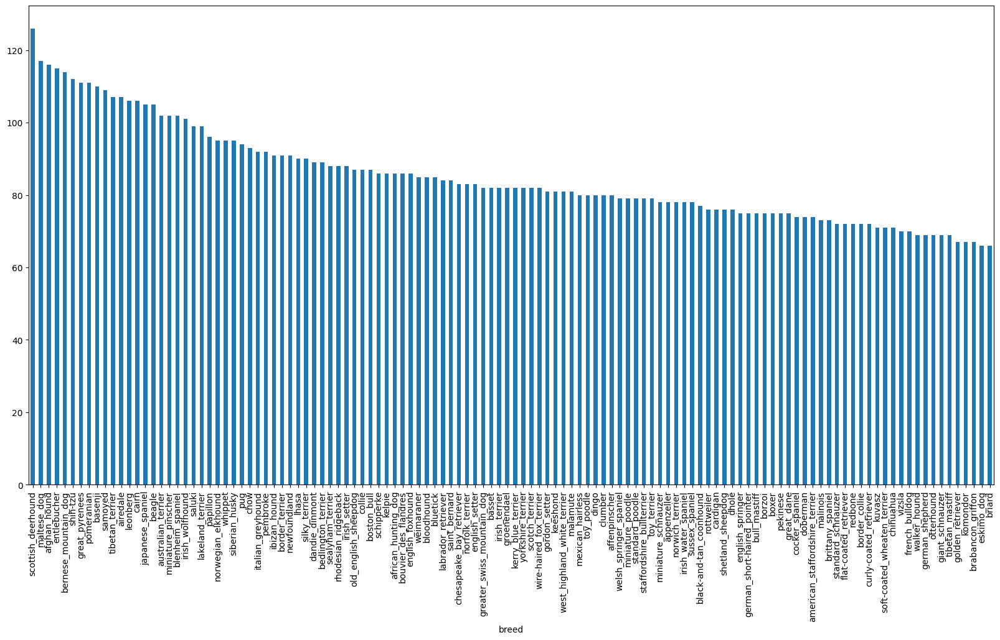

In [5]:
# How many images are there of each breed?
labels_csv["breed"].value_counts().plot.bar(figsize=(20, 10));


## Getting images and their labels
1.A list a filepaths to training images

2.An array of all labels

3.An array of all unique labels

In [6]:
filenames = ["drive/MyDrive/Dog Vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]

filenames[:10]


['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [7]:
import os
len(os.listdir("drive/MyDrive/Dog Vision/train/"))

10222

In [8]:
import os
if len(os.listdir("drive/MyDrive/Dog Vision/train/")) == len(filenames):
  print("All images are available")
else:
  print("Not all images are available")


All images are available


In [9]:
import numpy as np
labels = labels_csv["breed"].to_numpy()
labels[:10]

array(['boston_bull', 'dingo', 'pekinese', 'bluetick', 'golden_retriever',
       'bedlington_terrier', 'bedlington_terrier', 'borzoi', 'basenji',
       'scottish_deerhound'], dtype=object)

In [10]:
unique_breed = np.unique(labels)
print(len(unique_breed))
unique_breed


120


array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [11]:
if len(labels) == len(filenames):
  print("All Match")
else:
  print("Not Match")

All Match


In [12]:
labels[0] == unique_breed

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [13]:
unique_breed[0]

'affenpinscher'

In [14]:
boolean_labels = [label == np.array(unique_breed) for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [15]:
X = filenames
y = boolean_labels

In [16]:
NUM_IMAGES = 1000 #@param {type:"slider",min:1000,max:10000,step:1000}

In [17]:
from sklearn.model_selection import train_test_split

X_train,X_val,y_train,y_val = train_test_split(X[:NUM_IMAGES],
                                               y[:NUM_IMAGES],
                                               test_size=0.2,
                                               random_state=42)

len(X_train), len(X_val), len(y_train), len(y_val)

(800, 200, 800, 200)

## Turning images into Tensors
1.Takes an image filename as input.

2.Uses TensorFlow to read the file and save it to a variable, image.

3.Turn our image (a jpeg file) into Tensors.

4.Resize the image to be of shape (224, 224).

5.Return the modified image.

In [18]:
# convert image into numpy arrays
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [19]:
import tensorflow as tf
tf.constant(image)[:3]

<tf.Tensor: shape=(3, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]]], dtype=uint8)>

In [20]:
IMG_SIZE = 224

def process_image(image_path):
  """
  Takes an image file path and turns it into a TEnsor
  """
  #read a image
  image = tf.io.read_file(image_path)
  # convert it into tensors
  image = tf.image.decode_jpeg(image, channels=3)
  # convert the values of colour channel 0-255 to 0-1
  image = tf.image.convert_image_dtype(image, tf.float32)
  # resize the image
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image




## Creating data into Batches
Wonderful. Now we've got a function to convert our images into Tensors, we'll now build one to turn our data into batches (more specifically, a TensorFlow BatchDataset).

What's a batch?

A batch (also called mini-batch) is a small portion of your data, say 32 (32 is generally the default batch size) images and their labels. In deep learning, instead of finding patterns in an entire dataset at the same time, you often find them one batch at a time.

Let's say you're dealing with 10,000+ images (which we are). Together, these files may take up more memory than your GPU has. Trying to compute on them all would result in an error.

Instead, it's more efficient to create smaller batches of your data and compute on one batch at a time.

TensorFlow is very efficient when your data is in batches of (image, label) Tensors. So we'll build a function to do create those first. We'll take advantage of of process_image function at the same time.

In [21]:
# create a simple function to  return a tuple (image, label)
def get_image_label(image_path,label):
  """
  Takes an image file path name and the associated label,
  processes the image and returns a tuple of (image, label).
  """
  image = process_image(image_path)

  return image,label

In [22]:
BATCH_SIZE = 32

def create_data_batches(x,y=None, batch_size = BATCH_SIZE, valid_data = False, test_data = False):
  """
  Creates batches of data out of image (x) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle it if it's validation data.
  Also accepts test data as input (no labels).
  """
  #If we have Test data so we do not have labels
  if test_data:
    print("Creating test data into batches")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x)))
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  #If we have valid datasets we do not need to shuffle it
  elif valid_data:
    print("Creating valid data into batches")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                             tf.constant(y)))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch
  #If we have train datasets then we have to shuffle data
  else:
    print("Creating train data into batches")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                             tf.constant(y)))
    # shuffle the data before we use the map function
    data = data.shuffle(buffer_size=len(x))

    data_batch = data.map(get_image_label).batch(BATCH_SIZE)

    return data_batch




In [23]:
#Creating training and validation data batches

train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data = True)

Creating train data into batches
Creating valid data into batches


In [24]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [25]:
import matplotlib.pyplot as plt

def show_30_image(images, labels):
  plt.figure(figsize=(10,10))

  for i in range(30):
    ax = plt.subplot(5, 6, i+1)

    plt.imshow(images[i])

    plt.title(unique_breed[labels[i].argmax()])

    plt.axis("off")

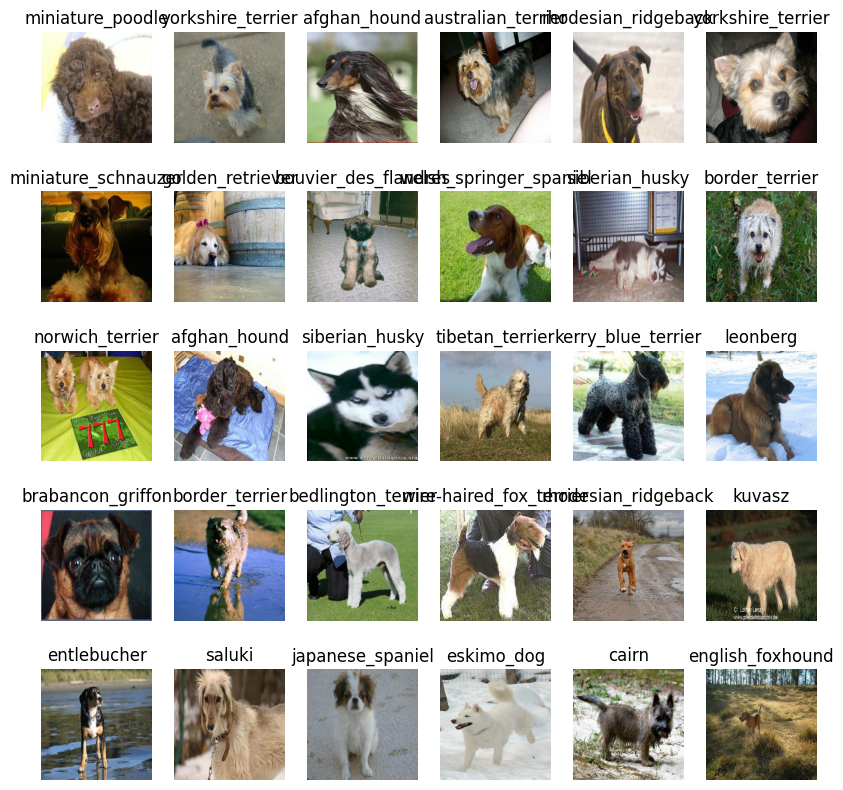

In [26]:
train_image, train_labels = next(train_data.as_numpy_iterator())
show_30_image(train_image,train_labels)

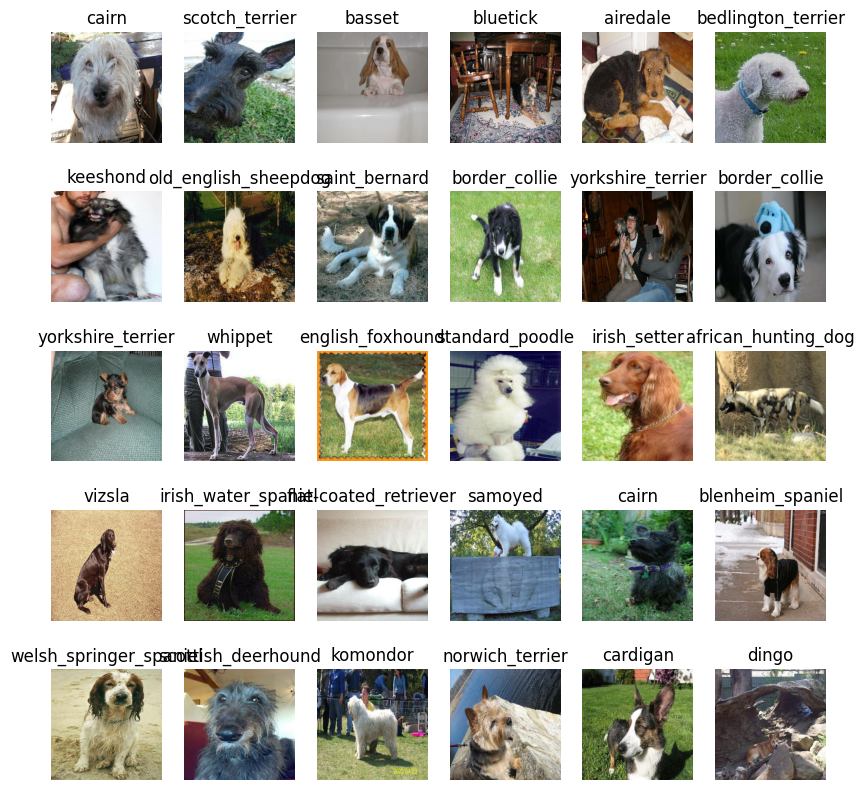

In [27]:
# Visualize validation images from the validation data batch
val_images, val_labels = next(val_data.as_numpy_iterator())
show_30_image(val_images, val_labels)

In [28]:
# Setup input shape to the model
INPUT_SHAPE = [IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of the model
OUTPUT_SHAPE = len(unique_breed) # number of unique labels


MODEL_URL = "https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2"

In [29]:
import tf_keras

# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf_keras.Sequential([
    hub.KerasLayer(model_url, input_shape=input_shape), # Layer 1 (input layer)
    tf_keras.layers.Dense(units=output_shape,
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf_keras.losses.CategoricalCrossentropy(), # Our model wants to reduce this (how wrong its guesses are)
      optimizer=tf_keras.optimizers.Adam(), # A friend telling our model how to improve its guesses
      metrics=["accuracy"] # We'd like this to go up
  )



  return model

In [30]:
# Create a model and check its details
model = create_model()
model.summary()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


In [31]:
%reload_ext tensorboard

In [47]:
import datetime
import os
#create callback
def create_tensorboard_callbacks():
  logdir = os.path.join("/content/drive/MyDrive/Dog Vision/logs",
                        datetime.datetime.now().strftime("%Y-%m-%d %H:%M:%S"))

  return tf_keras.callbacks.TensorBoard(logdir)

In [48]:
create_tensorboard_callbacks()

In [49]:
early_stopping = tf_keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

In [50]:
NUM_EPOCHS = 100 #@param {type:"slider",min:100, max:10000 , step:100}

In [72]:
#create model

def train_model():
  model = create_model()

  tensorboard = create_tensorboard_callbacks()

  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1, # check validation metrics every epoch
            callbacks=[tensorboard, early_stopping])

  return model

  model = train_model()

In [73]:
%tensorboard --logdir contents/drive/MyDrive/Dog\ Vision/logs

Output hidden; open in https://colab.research.google.com to view.

In [74]:
predictions = model.predict(val_data, verbose=1)

predictions

7/7 [==============================] - 1s 102ms/step


array([[0.00331519, 0.00123573, 0.00344842, ..., 0.00648428, 0.00237097,
        0.00117852],
       [0.00095183, 0.00422284, 0.02297126, ..., 0.01337881, 0.01882051,
        0.04174528],
       [0.00732787, 0.00257506, 0.00295564, ..., 0.00073975, 0.01374488,
        0.00467091],
       ...,
       [0.00628622, 0.00158112, 0.05101744, ..., 0.00137169, 0.00039665,
        0.00517572],
       [0.00557836, 0.0059313 , 0.00067644, ..., 0.00423095, 0.00498207,
        0.00244292],
       [0.0025159 , 0.01017726, 0.00074846, ..., 0.01752781, 0.00176761,
        0.01650747]], dtype=float32)

In [75]:
predictions.shape[0]

200

In [76]:
# First prediction
print(predictions[0])
print(f"Max value (probability of prediction): {np.max(predictions[0])}") # the max probability value predicted by the model
print(f"Sum: {np.sum(predictions[0])}") # because we used softmax activation in our model, this will be close to 1
print(f"Max index: {np.argmax(predictions[0])}") # the index of where the max value in predictions[0] occurs
print(f"Predicted label: {unique_breed[np.argmax(predictions[0])]}") # the predicted label

[0.00331519 0.00123573 0.00344842 0.00243223 0.0099045  0.0123482
 0.00381146 0.00555899 0.0014767  0.00298684 0.00941361 0.00891125
 0.01134102 0.00219979 0.01474732 0.01796119 0.00188346 0.03717176
 0.0077856  0.00761215 0.00275342 0.00025722 0.01272438 0.01161797
 0.00197588 0.00101564 0.0032407  0.01774704 0.00415971 0.0182094
 0.00226173 0.02031526 0.00341721 0.01936359 0.00564381 0.00199542
 0.00022703 0.01718779 0.00071474 0.02021354 0.00532073 0.00328247
 0.00157196 0.00058177 0.00241029 0.00226148 0.00026873 0.00032755
 0.02358476 0.00430065 0.00716116 0.00615886 0.02176822 0.03333554
 0.00107294 0.00638569 0.00058191 0.01018031 0.00045096 0.00557452
 0.0015091  0.00285413 0.00032669 0.00020029 0.0034623  0.09031897
 0.00095763 0.00065185 0.00486831 0.06095121 0.00261585 0.01298377
 0.0001472  0.00155812 0.00140758 0.00680304 0.00197897 0.04097471
 0.0030942  0.00194665 0.00023831 0.00176041 0.00441049 0.00404392
 0.0067749  0.01658389 0.00017953 0.00315129 0.00899109 0.010916

In [77]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breed[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[0])
pred_label

'komondor'

In [78]:
# Create a function to unbatch a batched dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breed[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [79]:
def plot_pred(prediction_probabilities, labels, images, n=100):
  """
  View the prediction, ground truth label and image for sample n.
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% ({})".format(pred_label,
                                      np.max(pred_prob)*100,
                                      true_label),
                                      color=color)

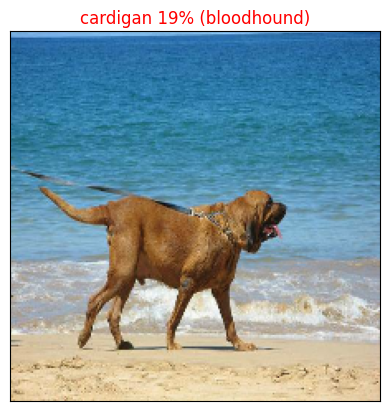

In [80]:
# View an example prediction, original image and truth label
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images)

In [81]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plots the top 10 highest prediction confidences along with
  the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breed[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

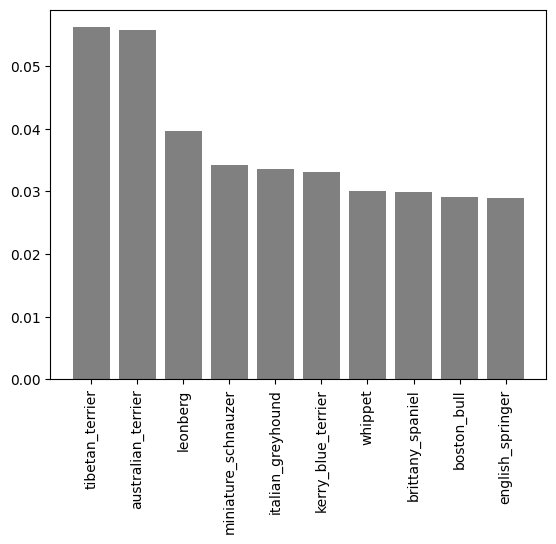

In [82]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

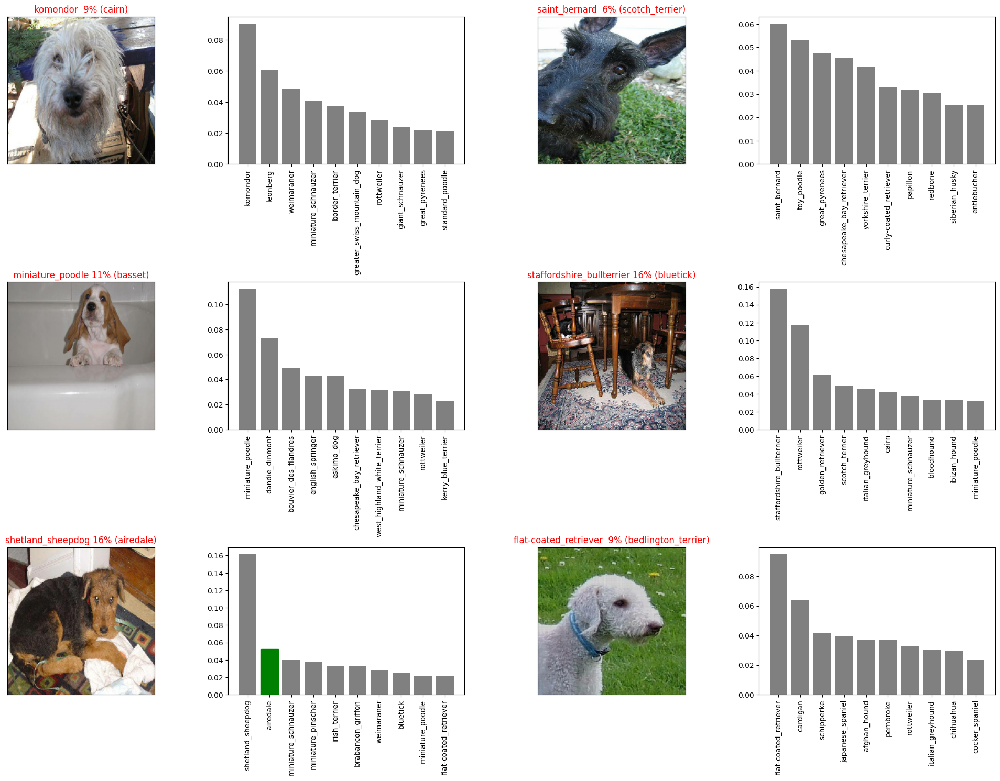

In [83]:
# Let's check a few predictions and their different values
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(5*2*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                labels=val_labels,
                n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

In [84]:
import os
import datetime

def save_model(model, suffix=""):
    """
    Saves a given model in a models directory and appends a suffix (str)
    for clarity and reuse. If no suffix is provided, it defaults to an empty string.
    """
    # Create model directory with current time
    modeldir = os.path.join("/content/drive/MyDrive/Dog Vision/models",
                            datetime.datetime.now().strftime("%Y-%m-%d-%H-%M-%S")) # Changed %s to %S for seconds
    # Ensure the directory exists
    os.makedirs(modeldir, exist_ok=True)

    # Check if suffix is None, and if so, set it to an empty string
    if suffix is None:
        suffix = ""

    # Define model path
    model_path = modeldir + "-" + suffix + ".keras"
    print(f"Saving model to: {model_path}...")

    # Save the model
    model.save(model_path)

    return model_path

# import os

# def save_model(model):
#     """
#     Saves a given model in a models directory without any suffix or timestamp.
#     """
#     # Define the model directory
#     modeldir = os.path.join("drive/My Drive/Dog Vision/models")

#     # Ensure the directory exists
#     os.makedirs(modeldir, exist_ok=True)

#     # Define the model path
#     model_path = os.path.join(modeldir, "model.h5")
#     print(f"Saving model to: {model_path}...")

#     # Save the model
#     model.save(model_path)

#     return model_path



In [85]:

def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf_keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [86]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-Adam")

Saving model to: /content/drive/MyDrive/Dog Vision/models/2025-06-19-07-20-47-1000-images-Adam.keras...


'/content/drive/MyDrive/Dog Vision/models/2025-06-19-07-20-47-1000-images-Adam.keras'

In [87]:
# Load our model trained on 1000 images
model_1000_images = load_model('/content/drive/MyDrive/Dog Vision/models/2025-06-19-07-20-47-1000-images-Adam.keras')

Loading saved model from: /content/drive/MyDrive/Dog Vision/models/2025-06-19-07-20-47-1000-images-Adam.keras


In [88]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 3s 180ms/step - loss: 5.7727 - accuracy: 0.0050


[5.772651195526123, 0.004999999888241291]

In [89]:
# Evaluate the loaded model
model_1000_images.evaluate(val_data)

7/7 [==============================] - 3s 95ms/step - loss: 5.7727 - accuracy: 0.0050


[5.772651195526123, 0.004999999888241291]

In [90]:
# Remind ourselves of the size of the full dataset
len(X), len(y)

(10222, 10222)

In [91]:
# Turn full training data in a data batch
full_data = create_data_batches(X, y)

Creating train data into batches


In [92]:
# Instantiate a new model for training on the full dataset
full_model = create_model()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2


In [93]:
# Create full model callbacks

# TensorBoard callback
full_model_tensorboard = create_tensorboard_callbacks()

# Early stopping callback
# Note: No validation set when training on all the data, therefore can't monitor validation accruacy
full_model_early_stopping = tf_keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

In [94]:
# Fit the full model to the full training data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard,
                          full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 987s 3s/step - loss: 1.3444 - accuracy: 0.6690
Epoch 2/100
320/320 [==============================] - 39s 123ms/step - loss: 0.3963 - accuracy: 0.8818
Epoch 3/100
320/320 [==============================] - 43s 135ms/step - loss: 0.2361 - accuracy: 0.9347
Epoch 4/100
320/320 [==============================] - 39s 123ms/step - loss: 0.1527 - accuracy: 0.9629
Epoch 5/100
320/320 [==============================] - 43s 136ms/step - loss: 0.1067 - accuracy: 0.9773
Epoch 6/100
320/320 [==============================] - 42s 130ms/step - loss: 0.0773 - accuracy: 0.9874
Epoch 7/100
320/320 [==============================] - 42s 131ms/step - loss: 0.0574 - accuracy: 0.9919
Epoch 8/100
320/320 [==============================] - 40s 126ms/step - loss: 0.0453 - accuracy: 0.9951
Epoch 9/100
320/320 [==============================] - 41s 128ms/step - loss: 0.0373 - accuracy: 0.9967
Epoch 10/100
320/320 [==============================] - 38s 119ms/

In [95]:

# Save model to file
save_model(full_model, suffix="all-images-Adam")

Saving model to: /content/drive/MyDrive/Dog Vision/models/2025-06-19-07-52-32-all-images-Adam.keras...


'/content/drive/MyDrive/Dog Vision/models/2025-06-19-07-52-32-all-images-Adam.keras'

In [96]:
# Load in the full model
loaded_full_model = load_model("/content/drive/MyDrive/Dog Vision/models/2025-06-19-07-52-32-all-images-Adam.keras")

Loading saved model from: /content/drive/MyDrive/Dog Vision/models/2025-06-19-07-52-32-all-images-Adam.keras


In [97]:
# Load test image filenames (since we're using os.listdir(), these already have .jpg)
test_path = "drive/MyDrive/Dog Vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]

test_filenames[:10]

['drive/MyDrive/Dog Vision/test/f09826fc9cb9aa425caae5f8aaaa8bef.jpg',
 'drive/MyDrive/Dog Vision/test/ede76874678b483c87bfe1db25f78f9b.jpg',
 'drive/MyDrive/Dog Vision/test/e8d5c81029e17c81b06af60ec4113b30.jpg',
 'drive/MyDrive/Dog Vision/test/f20017c781603ca2d286361592b12dc4.jpg',
 'drive/MyDrive/Dog Vision/test/f0b37b4b6d1452125b4cb91f08008298.jpg',
 'drive/MyDrive/Dog Vision/test/ef8604e60473eb234c5725219f338df8.jpg',
 'drive/MyDrive/Dog Vision/test/e8e68264f76c3398ecb6c67b9bb52833.jpg',
 'drive/MyDrive/Dog Vision/test/f592d6ca12a9d99c18f26260c3eb148a.jpg',
 'drive/MyDrive/Dog Vision/test/f054f5578e5c9d3f6759b357df3c5f16.jpg',
 'drive/MyDrive/Dog Vision/test/e83fec66a32873298df9fa5fdac113aa.jpg']

In [98]:
# How many test images are there?
len(test_filenames)

10357

In [99]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data into batches


In [100]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 266s 809ms/step


In [101]:
# Check out the test predictions
test_predictions[:10]

array([[2.3672164e-10, 5.4749227e-09, 4.1600838e-09, ..., 1.1395260e-07,
        1.5981204e-05, 3.7990429e-09],
       [1.6741728e-13, 3.7961513e-07, 2.9227415e-10, ..., 2.4282224e-06,
        3.0148973e-07, 1.0439063e-06],
       [5.6310999e-08, 3.3256747e-06, 2.1807516e-08, ..., 6.5367765e-08,
        8.6076440e-08, 1.1450053e-08],
       ...,
       [9.4125285e-10, 2.1223387e-10, 8.5824006e-08, ..., 1.3205722e-11,
        5.8192383e-12, 4.7157317e-10],
       [4.5176250e-12, 4.1631057e-10, 4.6150882e-13, ..., 6.8828294e-12,
        5.5660641e-09, 2.8142830e-10],
       [1.5909661e-08, 4.6834359e-09, 4.2852855e-10, ..., 6.4879274e-08,
        5.3294099e-07, 1.4657807e-09]], dtype=float32)

In [106]:
import os
# # prediction on custom data
# # Get custom image filepaths
custom_path = "/content/drive/MyDrive/Dog Vision/dogs/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]
custom_image_paths


['/content/drive/MyDrive/Dog Vision/dogs/pitbull.jpeg',
 '/content/drive/MyDrive/Dog Vision/dogs/bulldog.jpg',
 '/content/drive/MyDrive/Dog Vision/dogs/chow chow.jpg',
 '/content/drive/MyDrive/Dog Vision/dogs/german sheferd.jpg',
 '/content/drive/MyDrive/Dog Vision/dogs/labrador retriever.jpg',
 '/content/drive/MyDrive/Dog Vision/dogs/rottweiler.jpg',
 '/content/drive/MyDrive/Dog Vision/dogs/download (4).jpg',
 '/content/drive/MyDrive/Dog Vision/dogs/doberman.jpg']

In [107]:
len(custom_image_paths)

8

In [109]:
# Turn custom image into batch (set to test data because there are no labels)
import tensorflow as tf
custom_data = create_data_batches(x=custom_image_paths, test_data=True)
custom_data

Creating test data into batches


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [110]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 1s 1s/step


In [111]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['staffordshire_bullterrier',
 'boxer',
 'chow',
 'german_shepherd',
 'labrador_retriever',
 'rottweiler',
 'bull_mastiff',
 'doberman']

Loading saved model from: /content/drive/MyDrive/Dog Vision/models/2025-06-19-07-52-32-all-images-Adam.keras


Saving download (5).jpg to download (5) (1).jpg
1/1 [==============================] - 1s 1s/step


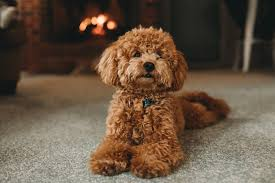

Predicted dog breed: toy poodle


In [114]:
import os
import tensorflow as tf
from tensorflow.keras.preprocessing import image
from IPython.display import display
from PIL import Image
import numpy as np
from google.colab import files
import tf_keras
import tensorflow_hub as hub

def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf_keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

model_path = '/content/drive/MyDrive/Dog Vision/models/2025-06-19-07-52-32-all-images-Adam.keras'  # Replace with your model path
loaded_model = load_model(model_path)


IMG_SIZE = 224

def process_image(filename):
    """
    Takes a filename and returns a preprocessed image tensor.
    """
    # Read the image
    image = tf.io.read_file(filename)
    # Decode into tensor with 3 color channels
    image = tf.image.decode_jpeg(image, channels=3)
    # Normalize the pixel values to [0, 1]
    image = tf.image.convert_image_dtype(image, tf.float32)
    # Resize the image
    image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])
    return image

unique_breed = ['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
       'great_pyrenees', 'greater_swiss_mountain_dog', 'groenendael',
       'ibizan_hound', 'irish_setter', 'irish_terrier',
       'irish_water_spaniel', 'irish_wolfhound', 'italian_greyhound',
       'japanese_spaniel', 'keeshond', 'kelpie', 'kerry_blue_terrier',
       'komondor', 'kuvasz', 'labrador_retriever', 'lakeland_terrier',
       'leonberg', 'lhasa', 'malamute', 'malinois', 'maltese_dog',
       'mexican_hairless', 'miniature_pinscher', 'miniature_poodle',
       'miniature_schnauzer', 'newfoundland', 'norfolk_terrier',
       'norwegian_elkhound', 'norwich_terrier', 'old_english_sheepdog',
       'otterhound', 'papillon', 'pekinese', 'pembroke', 'pomeranian',
       'pug', 'redbone', 'rhodesian_ridgeback', 'rottweiler',
       'saint_bernard', 'saluki', 'samoyed', 'schipperke',
       'scotch_terrier', 'scottish_deerhound', 'sealyham_terrier',
       'shetland_sheepdog', 'shih-tzu', 'siberian_husky', 'silky_terrier',
       'soft-coated_wheaten_terrier', 'staffordshire_bullterrier',
       'standard_poodle', 'standard_schnauzer', 'sussex_spaniel',
       'tibetan_mastiff', 'tibetan_terrier', 'toy_poodle', 'toy_terrier',
       'vizsla', 'walker_hound', 'weimaraner', 'welsh_springer_spaniel',
       'west_highland_white_terrier', 'whippet',
       'wire-haired_fox_terrier', 'yorkshire_terrier']


#remove underscore in the breed name
unique_breed = [breed.replace('_', ' ') for breed in unique_breed]
# Function to upload image from local
def upload_and_predict(model):
    uploaded = files.upload()
    for filename in uploaded.keys():
        # Load image and preprocess it
        img = process_image(filename)
        # Expand dimensions to add batch size
        img = tf.expand_dims(img, axis=0)
        # Make prediction
        pred = model.predict(img)
        # Get predicted label
        pred_label = get_pred_label(pred)
        # Display image and prediction
        display(Image.open(filename))
        print(f"Predicted dog breed: {pred_label}")

#Function to map predictions to class labels
def get_pred_label(pred):

    return unique_breed[np.argmax(pred)]

# Call the function to upload an image and predict
upload_and_predict(loaded_model)



In [116]:
# import os
# import tensorflow as tf
# from tensorflow.keras.preprocessing import image
# from IPython.display import display
# from PIL import Image
# import numpy as np
# from google.colab import files
# import tf_keras


# def load_model(model_path):
#   """
#   Loads a saved model from a specified path.
#   """
#   print(f"Loading saved model from: {model_path}")
#   model = tf_keras.models.load_model(model_path,
#                                      custom_objects={"KerasLayer":hub.KerasLayer})
#   return model


# # Cell 2: Load the saved model

# model_path = 'drive/My Drive/Dog Vision/models/2025-05-31-11-54-03-all-images-Adam.keras'  # Replace with your model path
# loaded_model = load_model(model_path)
# # Function to upload image from local
# def upload_and_predict(model):
#     uploaded = files.upload()
#     for filename in uploaded.keys():
#         # Load image and preprocess it
#         img = process_image(filename)
#         # Expand dimensions to add batch size
#         img = tf.expand_dims(img, axis=0)
#         # Make prediction
#         pred = model.predict(img)
#         # Get predicted label
#         pred_label = get_pred_label(pred)
#         # Display image and prediction
#         display(Image.open(filename))
#         print(f"Predicted dog breed: {pred_label}")

# #Function to map predictions to class labels
# def get_pred_label(pred):

#     return unique_breed[np.argmax(pred)]

# # Call the function to upload an image and predict
# upload_and_predict(loaded_model)


In [115]:
!pip install gradio tensorflow tensorflow-hub tf-keras numpy Pillow
!pip install --upgrade gradio

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.3/54.3 MB 17.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 323.6/323.6 kB 26.2 MB/s eta 0:00:00
  Attempting uninstall: gradio-client
    Found existing installation: gradio_client 1.10.1
    Uninstalling gradio_client-1.10.1:
      Successfully uninstalled gradio_client-1.10.1
  Attempting uninstall: gradio
    Found existing installation: gradio 5.31.0
    Uninstalling gradio-5.31.0:
      Successfully uninstalled gradio-5.31.0


In [117]:
import os
import gradio as gr
import tensorflow as tf
import numpy as np
from PIL import Image
import tf_keras
import tensorflow_hub as hub
from google.colab import drive, files
from IPython.display import display, clear_output
import warnings
warnings.filterwarnings('ignore')

# Check versions
print("📋 Current Versions:")
print(f"TensorFlow: {tf.__version__}")
print(f"TensorFlow Hub: {hub.__version__}")
print(f"Gradio: {gr.__version__}")

📋 Current Versions:
TensorFlow: 2.18.0
TensorFlow Hub: 0.16.1
Gradio: 5.34.1


In [118]:
drive.mount('/content/drive')
print("✅ Google Drive mounted successfully!")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
✅ Google Drive mounted successfully!


In [119]:
class DogBreedClassifier:
    def __init__(self, model_path=None):
        """
        Initialize the dog breed classifier with model and breed labels.
        """
        self.IMG_SIZE = 224
        self.unique_breed = [
            'affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
            'american_staffordshire_terrier', 'appenzeller', 'australian_terrier',
            'basenji', 'basset', 'beagle', 'bedlington_terrier', 'bernese_mountain_dog',
            'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound', 'bluetick',
            'border_collie', 'border_terrier', 'borzoi', 'boston_bull',
            'bouvier_des_flandres', 'boxer', 'brabancon_griffon', 'briard',
            'brittany_spaniel', 'bull_mastiff', 'cairn', 'cardigan',
            'chesapeake_bay_retriever', 'chihuahua', 'chow', 'clumber',
            'cocker_spaniel', 'collie', 'curly-coated_retriever', 'dandie_dinmont',
            'dhole', 'dingo', 'doberman', 'english_foxhound', 'english_setter',
            'english_springer', 'entlebucher', 'eskimo_dog', 'flat-coated_retriever',
            'french_bulldog', 'german_shepherd', 'german_short-haired_pointer',
            'giant_schnauzer', 'golden_retriever', 'gordon_setter', 'great_dane',
            'great_pyrenees', 'greater_swiss_mountain_dog', 'groenendael',
            'ibizan_hound', 'irish_setter', 'irish_terrier', 'irish_water_spaniel',
            'irish_wolfhound', 'italian_greyhound', 'japanese_spaniel', 'keeshond',
            'kelpie', 'kerry_blue_terrier', 'komondor', 'kuvasz', 'labrador_retriever',
            'lakeland_terrier', 'leonberg', 'lhasa', 'malamute', 'malinois',
            'maltese_dog', 'mexican_hairless', 'miniature_pinscher', 'miniature_poodle',
            'miniature_schnauzer', 'newfoundland', 'norfolk_terrier',
            'norwegian_elkhound', 'norwich_terrier', 'old_english_sheepdog',
            'otterhound', 'papillon', 'pekinese', 'pembroke', 'pomeranian', 'pug',
            'redbone', 'rhodesian_ridgeback', 'rottweiler', 'saint_bernard', 'saluki',
            'samoyed', 'schipperke', 'scotch_terrier', 'scottish_deerhound',
            'sealyham_terrier', 'shetland_sheepdog', 'shih-tzu', 'siberian_husky',
            'silky_terrier', 'soft-coated_wheaten_terrier', 'staffordshire_bullterrier',
            'standard_poodle', 'standard_schnauzer', 'sussex_spaniel', 'tibetan_mastiff',
            'tibetan_terrier', 'toy_poodle', 'toy_terrier', 'vizsla', 'walker_hound',
            'weimaraner', 'welsh_springer_spaniel', 'west_highland_white_terrier',
            'whippet', 'wire-haired_fox_terrier', 'yorkshire_terrier'
        ]

        # remove underscore of the breed name
        self.unique_breed = [breed.replace('_', ' ') for breed in self.unique_breed]


        self.model = None
        if model_path:
            self.model = self.load_model(model_path)

    def load_model(self, model_path):
        """
        Loads a saved model from a specified path with multiple fallback methods.
        """
        if not os.path.exists(model_path):
            print(f"❌ Model file not found: {model_path}")
            return None

        try:
            print(f"🔄 Loading model from: {model_path}")

            # Method 1: Try with compile=False first (most common fix)
            try:
                model = tf_keras.models.load_model(
                    model_path,
                    custom_objects={"KerasLayer": hub.KerasLayer},
                    compile=False
                )
                print("✅ Model loaded successfully with tf_keras (compile=False)!")
                return model
            except Exception as e1:
                print(f"Method 1 failed: {str(e1)[:100]}...")

            # Method 2: Try with standard TensorFlow
            try:
                model = tf.keras.models.load_model(
                    model_path,
                    custom_objects={"KerasLayer": hub.KerasLayer},
                    compile=False
                )
                print("✅ Model loaded successfully with tf.keras!")
                return model
            except Exception as e2:
                print(f"Method 2 failed: {str(e2)[:100]}...")

            # Method 3: Try loading as SavedModel
            try:
                model = tf.saved_model.load(model_path)
                print("✅ Model loaded as SavedModel!")
                return model
            except Exception as e3:
                print(f"Method 3 failed: {str(e3)[:100]}...")

            raise Exception("All loading methods failed")

        except Exception as e:
            print(f"❌ Error loading model: {e}")
            print("\n🔧 Troubleshooting tips:")
            print("1. Verify the model file path is correct")
            print("2. Check if Google Drive is mounted (if model is in Drive)")
            print("3. Try the model conversion utility below")
            return None

    def preprocess_image(self, image):
        """
        Preprocesses PIL Image for model prediction.
        """
        # Convert PIL Image to numpy array
        img_array = np.array(image)

        # Convert to tensor
        img_tensor = tf.constant(img_array)

        # Ensure 3 channels (RGB)
        if len(img_tensor.shape) == 2:  # Grayscale
            img_tensor = tf.stack([img_tensor] * 3, axis=-1)
        elif img_tensor.shape[-1] == 4:  # RGBA
            img_tensor = img_tensor[:, :, :3]

        # Normalize pixel values to [0, 1]
        img_tensor = tf.cast(img_tensor, tf.float32) / 255.0

        # Resize image
        img_tensor = tf.image.resize(img_tensor, [self.IMG_SIZE, self.IMG_SIZE])

        # Add batch dimension
        img_tensor = tf.expand_dims(img_tensor, 0)

        return img_tensor

    def predict_breed(self, image):
        """
        Predicts dog breed from PIL Image and returns breed name with confidence.
        """
        if self.model is None:
            return "❌ Error: Model not loaded", 0.0

        try:
            # Preprocess image
            processed_img = self.preprocess_image(image)

            # Make prediction - handle different model types
            try:
                if hasattr(self.model, 'predict'):
                    # For Keras models
                    predictions = self.model.predict(processed_img, verbose=0)
                else:
                    # For SavedModel format
                    predictions = self.model(processed_img)
                    if isinstance(predictions, dict):
                        predictions = list(predictions.values())[0]
                    predictions = predictions.numpy()
            except Exception as pred_error:
                return f"❌ Prediction failed: {str(pred_error)}", 0.0

            # Get predicted class and confidence
            predicted_class = np.argmax(predictions[0])
            confidence = float(predictions[0][predicted_class])

            # Get breed name and format it
            predicted_breed = self.unique_breed[predicted_class]
            formatted_breed = predicted_breed.replace('_', ' ').title()

            return formatted_breed, confidence

        except Exception as e:
            return f"❌ Error in prediction: {str(e)}", 0.0

In [120]:
def create_colab_interface(classifier):
    """
    Creates a Gradio interface optimized for Google Colab.
    """
    def predict_with_details(image):
        if image is None:
            return "Please upload an image", "No confidence score", None

        breed, confidence = classifier.predict_breed(image)

        if confidence == 0.0:
            return breed, "Error occurred", image

        confidence_text = f"{confidence:.2%}"
        result_text = f"🐕 **Predicted Breed:** {breed}"

        return result_text, confidence_text, image

    # Create interface with Colab-friendly settings
    interface = gr.Interface(
        fn=predict_with_details,
        inputs=[
            gr.Image(type="pil", label="📸 Upload Dog Image", height=300)
        ],
        outputs=[
            gr.Textbox(label="🎯 Prediction Result", lines=2),
            gr.Textbox(label="📊 Model Confidence", lines=1),
            gr.Image(label="📷 Uploaded Image", height=200)
        ],
        title="🐕 Dog Breed Classifier",
        description="""
        **Upload an image of a dog and I'll predict its breed!**

        📋 Supports 120 different dog breeds
        📊 Shows prediction confidence
        🚀 Powered by TensorFlow & TensorFlow Hub
        """,
        theme=gr.themes.Soft(),
        allow_flagging="never",
        analytics_enabled=False
    )

    return interface

In [121]:
def upload_and_predict_simple(classifier):
    """
    Simple function to upload image and get prediction (without Gradio).
    """
    print("📁 Upload your dog image:")
    uploaded = files.upload()

    for filename in uploaded.keys():
        try:
            # Load and display image
            img = Image.open(filename)
            display(img)

            # Make prediction
            breed, confidence = classifier.predict_breed(img)

            print(f"\n🎯 Predicted Breed: {breed}")
            print(f"📊 Confidence: {confidence:.2%}")

        except Exception as e:
            print(f"❌ Error processing {filename}: {e}")

In [129]:
def run_dog_classifier_app():
    """
    Main function to set up and run the dog breed classifier.
    """
    # 🔧 UPDATE THIS PATH TO YOUR MODEL LOCATION
    MODEL_PATH = "/content/drive/MyDrive/Dog Vision/models/2025-06-19-07-52-32-all-images-Adam.keras"

    print("🚀 Starting Dog Breed Classifier...")
    print(f"📁 Looking for model at: {MODEL_PATH}")

    # Initialize classifier
    classifier = DogBreedClassifier(MODEL_PATH)

    if classifier.model is None:
        print("\n❌ Model loading failed!")
        print("\n🔧 Options to fix this:")
        print("1. Update MODEL_PATH with correct path")
        print("2. Mount Google Drive if model is in Drive")
        print("3. Use the model conversion utility above")
        print("4. Upload model file directly to Colab")
        return None

    print("✅ Model loaded successfully!")

    # Create and launch Gradio interface
    interface = create_colab_interface(classifier)

    print("🌐 Launching web interface...")
    return interface.launch(
        share=True,  # Creates public link
        debug=True,
        show_error=True,
        quiet=False
    )


In [130]:
def run_simple_classifier():
    """
    Alternative method without Gradio - just upload and predict.
    """
    # Update this path
    MODEL_PATH = "/content/drive/MyDrive/Dog Vision/models/2025-06-19-07-52-32-all-images-Adam.keras"

    classifier = DogBreedClassifier(MODEL_PATH)

    if classifier.model is None:
        print("❌ Model not loaded. Please check the path.")
        return

    print("✅ Model ready! Now upload your dog image:")
    upload_and_predict_simple(classifier)

In [ ]:
run_dog_classifier_app()

🚀 Starting Dog Breed Classifier...
📁 Looking for model at: /content/drive/MyDrive/Dog Vision/models/2025-06-19-07-52-32-all-images-Adam.keras
🔄 Loading model from: /content/drive/MyDrive/Dog Vision/models/2025-06-19-07-52-32-all-images-Adam.keras
✅ Model loaded successfully with tf_keras (compile=False)!
✅ Model loaded successfully!
🌐 Launching web interface...
Colab notebook detected. This cell will run indefinitely so that you can see errors and logs. To turn off, set debug=False in launch().
* Running on public URL: https://5d96f86d39666484b3.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)
